In [58]:
%load_ext autoreload
%autoreload 2

In [1]:
import pandas as pd
import numpy as np
import cv2
import matplotlib.pyplot as plt
import requests

from glob import glob

import IPython.display as ipd
#from tqdm import tqdm

import subprocess

plt.style.use('ggplot')

from pytube import YouTube

In [4]:
! pip install pytube

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.0/57.0 kB 1.3 MB/s eta 0:00:00a 0:00:01


# Import a video using PyTube

In [2]:
yt = YouTube('https://www.youtube.com/watch?v=gO8N3L_aERg')

### Get video info

In [3]:
yt.title

'Fire Drill  - The Office US'

In [4]:
yt.thumbnail_url

'https://i.ytimg.com/vi/gO8N3L_aERg/sddefault.jpg'

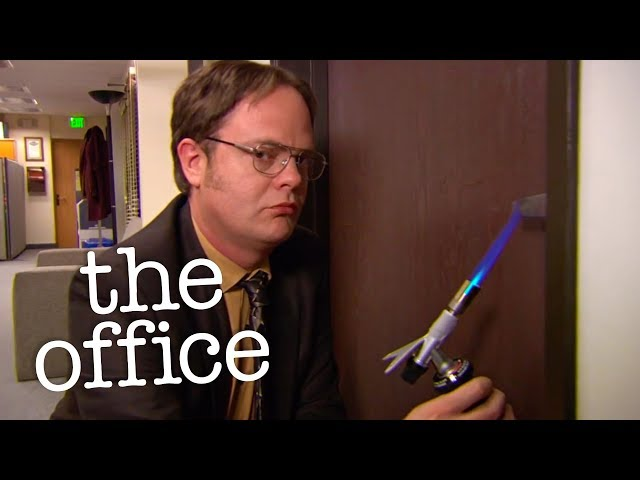

In [5]:
ipd.Image(requests.get(yt.thumbnail_url).content)

# Download video and show

In [6]:
# Streams, different quality versions of video
list(yt.streams.filter(file_extension='mp4'))

[<Stream: itag="18" mime_type="video/mp4" res="360p" fps="24fps" vcodec="avc1.42001E" acodec="mp4a.40.2" progressive="True" type="video">,
 <Stream: itag="22" mime_type="video/mp4" res="720p" fps="24fps" vcodec="avc1.64001F" acodec="mp4a.40.2" progressive="True" type="video">,
 <Stream: itag="136" mime_type="video/mp4" res="720p" fps="24fps" vcodec="avc1.4d401f" progressive="False" type="video">,
 <Stream: itag="398" mime_type="video/mp4" res="720p" fps="24fps" vcodec="av01.0.05M.08" progressive="False" type="video">,
 <Stream: itag="135" mime_type="video/mp4" res="480p" fps="24fps" vcodec="avc1.4d401e" progressive="False" type="video">,
 <Stream: itag="397" mime_type="video/mp4" res="480p" fps="24fps" vcodec="av01.0.04M.08" progressive="False" type="video">,
 <Stream: itag="134" mime_type="video/mp4" res="360p" fps="24fps" vcodec="avc1.4d401e" progressive="False" type="video">,
 <Stream: itag="396" mime_type="video/mp4" res="360p" fps="24fps" vcodec="av01.0.01M.08" progressive="False"

In [7]:
stream = yt.streams.get_by_itag(18)
stream.download()

'/home/daniel/code/dosorio79/code/kolapally/computer_vision/notebooks/video_analysis/Fire Drill  - The Office US.mp4'

In [79]:
video_path = '/home/daniel/code/dosorio79/code/kolapally/computer_vision/notebooks/video_analysis/Fire Drill  - The Office US.mp4'

In [3]:
ipd.Video(video_path, width=700)

# Open video in cv2 - Check properties

In [3]:
# Load in video capture
cap = cv2.VideoCapture('/home/daniel/code/dosorio79/code/kolapally/computer_vision/notebooks/video_analysis/Fire Drill  - The Office US.mp4')

In [4]:
# Total number of frames in video
cap.get(cv2.CAP_PROP_FRAME_COUNT)

7114.0

In [5]:
# Video height and width
height = cap.get(cv2.CAP_PROP_FRAME_HEIGHT)
width = cap.get(cv2.CAP_PROP_FRAME_WIDTH)
print(f'Height {height}, Width {width}')

Height 360.0, Width 640.0


In [6]:
# Get frames per second
fps = cap.get(cv2.CAP_PROP_FPS)
print(f'FPS : {fps:0.2f}')

FPS : 23.98


# Plot and get frames

In [43]:
# cap.read returns true and an frame until there are no more frames then returns false
cap = cv2.VideoCapture(video_path)
ret, img = cap.read()
print(f'Returned {ret} and img of shape {img.shape}')

Returned True and img of shape (360, 640, 3)


In [44]:
cap.release()

IndexError: index 25 is out of bounds for axis 0 with size 25

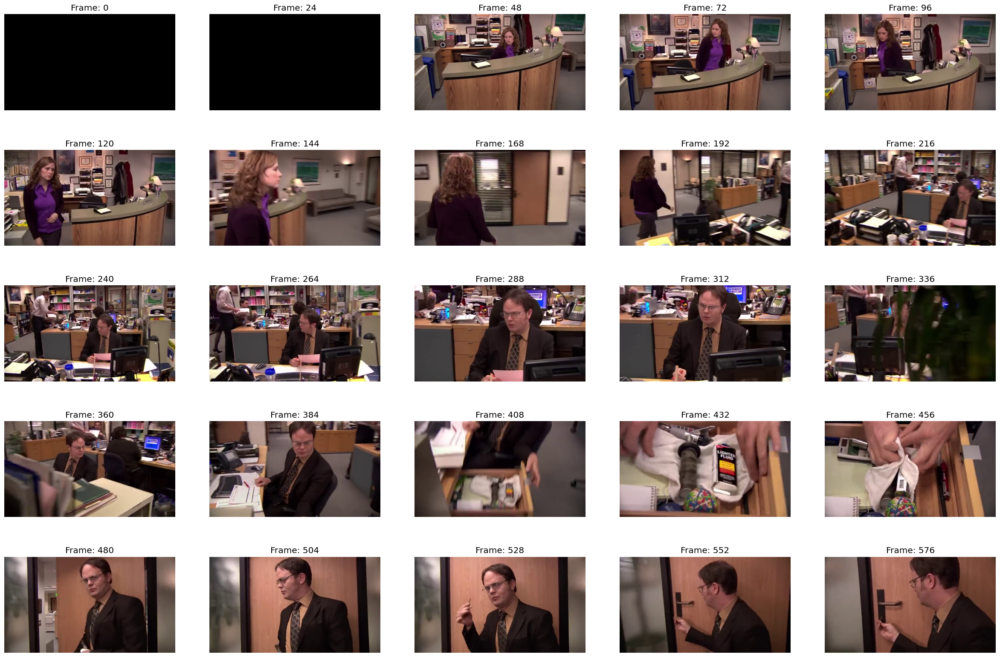

In [49]:
# Ploting every 100th frame
fig, axs = plt.subplots(5, 5, figsize=(30, 20))
axs = axs.flatten()

cap = cv2.VideoCapture(video_path)
n_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

img_idx = 0
for frame in range(2400):
    ret, img = cap.read()
    if ret == False:
        break
    if frame % 24 == 0:
        axs[img_idx].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        axs[img_idx].set_title(f'Frame: {frame}')
        axs[img_idx].axis('off')
        img_idx += 1

plt.tight_layout()
plt.show()
cap.release()

In [52]:
# Get a specific frame - This was on the tutorial, probably could use a better loop strategy

frame_capture = 1000

cap = cv2.VideoCapture(video_path)
n_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

img_idx = 0
for frame in range(n_frames):
    ret, img = cap.read()
    if ret == False:
        break
    if frame == frame_capture:
        break
cap.release()

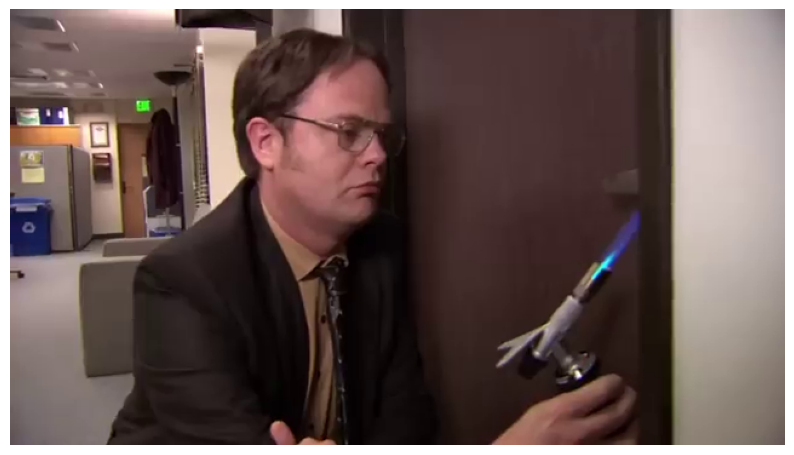

In [53]:
## Helper function for plotting opencv images in notebook
def display_cv2_img(img, figsize=(10, 10)):
    img_ = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    fig, ax = plt.subplots(figsize=figsize)
    ax.imshow(img_)
    ax.axis("off")
    
display_cv2_img(img)

# Extracting video frames to analyse

## Functions using the whole movie

In [9]:
# Load the mp4 video, open in cap object

cap = cv2.VideoCapture(video_path)
frame_rate_fps = round(cap.get(cv2.CAP_PROP_FPS),0)
n_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
t_label_freq_s = 1

# How often to get the frame based on
frame_freq = frame_rate_fps*t_label_freq_s
total_frames_to_label = int(n_frames/frame_freq)

# loops through the video object and gets the frame based on the frame frequency
frame_label_list = []
for frame in range(n_frames):
    ret, img = cap.read()
    # When you reach the end of the movie ret becomes False, it breaks
    if ret == False:
        break
    # Frames to be recovered are the multiples of the frame_freq
    if frame % frame_freq == 0:
        image = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        frame_label_list.append(image)
print(f"Movie frame rate: {frame_rate_fps}")
print(f"Movie total frames: {n_frames}")
print(f"Chosen detection frequency: {frame_freq}")
print(f"Total images the analyse: {total_frames_to_label}")

cap.release()

# Params: video_file, label frequency
# Could return the list and even a dictionary with chosen setting outcomes

Movie frame rate: 24.0
Movie total frames: 7114
Chosen detection frequency: 24.0
Total images the analyse: 296


In [ ]:
# function version of the previous
def frames_to_label(video_path: str, label_frequency=1):
    
    # Open video and get info
    cap = cv2.VideoCapture(video_path)
    frame_rate_fps = round(cap.get(cv2.CAP_PROP_FPS),0)
    n_frames = round(cap.get(cv2.CAP_PROP_FRAME_COUNT),0)

    # Calculate the frame frequency and the total number of frames to be labelled
    frame_freq = frame_rate_fps*label_frequency
    total_frames_to_label = int(n_frames/frame_freq)

    # loops through the video object and gets the frame based on the frame frequency
    frame_label_list = []
    for frame in range(n_frames):
        ret, img = cap.read()
        # When you reach the end of the movie ret becomes False, it breaks
        if ret == False:
            break
        # Frames to be recovered are the multiples of the frame_freq
        if frame % frame_freq == 0:
            image = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            frame_label_list.append(image)
            
    # Outputs for reference
    print(f"Movie frame rate: {frame_rate_fps}")
    print(f"Movie total frames: {n_frames}")
    print(f"Chosen detection frequency: {frame_freq}")
    print(f"Total images the analyse: {total_frames_to_label}")
    
    # release cap object
    cap.release()
    
    # Return a list with the images of the selected frames, could also return a dictionary with chosen setting outcomes
    return frame_label_list

### ploting frames on the list

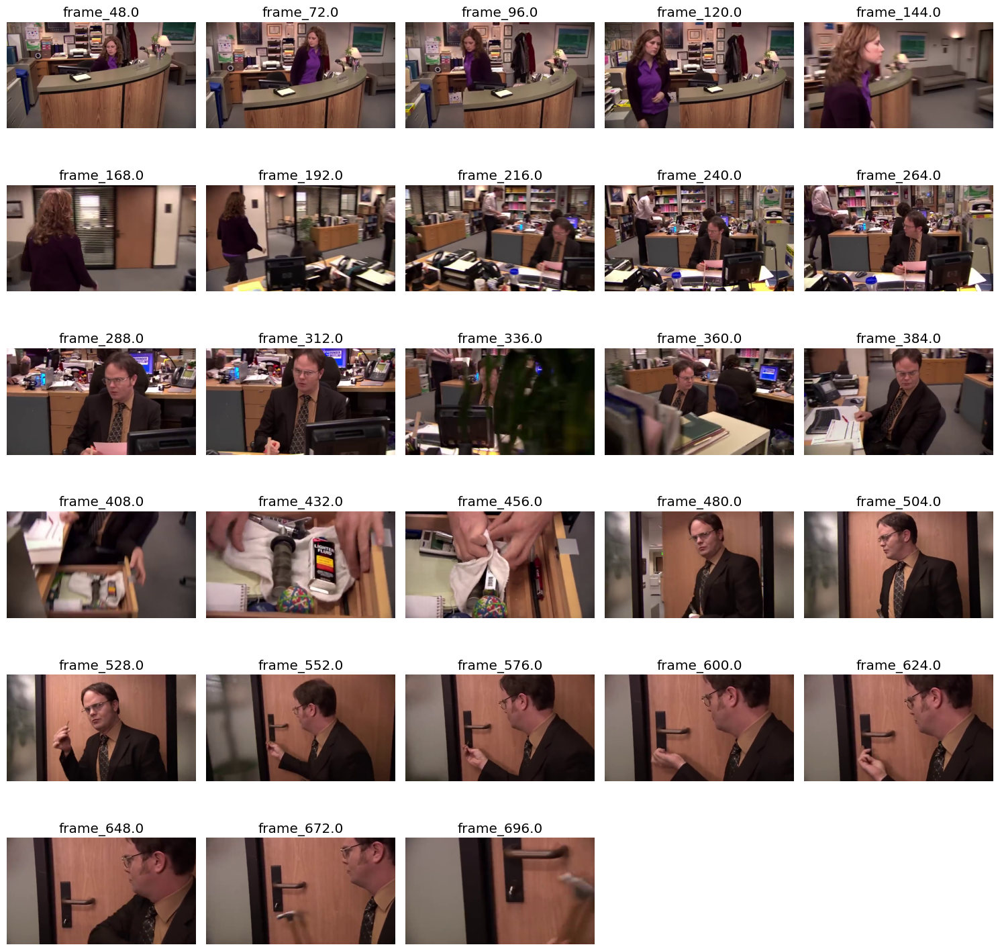

In [13]:
plot_frames(frame_label_list, frame_freq, start_frame=2, end_frame=30)

#### helper plot function

In [7]:
# Helper function to plot a range of frames inside the img_list

def plot_frames(img_list, frame_freq, start_frame=0, end_frame=None):
    if end_frame is None:
        end_frame = len(img_list)
        
    # Get rows and column numbers based on the total numbers of images and the selected range
    num_images = end_frame - start_frame
    num_rows = int(num_images**0.5) + 1
    num_cols = int(num_images / num_rows) + 1

    fig, axs = plt.subplots(num_rows, num_cols, figsize=(15,15))
    axs = axs.flatten()

    for i, j in enumerate(range(start_frame, end_frame)):
        axs[i].imshow(img_list[j])
        axs[i].axis('off')
        axs[i].set_title(f"frame_{j * frame_freq}")

    for ax in axs[num_images:]:
        fig.delaxes(ax)

    plt.tight_layout()
    plt.show()

## Functions using just a part of the movie

### Notebook version

In [21]:
# input defined start and stop point in seconds for the video and labelling frequency
start_point_s = 20
end_point_s = 50
t_label_freq_s = 1

# Load the full mp4 video, open in cap object
cap = cv2.VideoCapture(video_path)
frame_rate_fps = int(round(cap.get(cv2.CAP_PROP_FPS),0))
n_frames = int(round(cap.get(cv2.CAP_PROP_FRAME_COUNT),0))

# Calculate the start and stop frame
start_frame = start_point_s*frame_rate_fps
end_frame = end_point_s*frame_rate_fps
n_frames = end_frame - start_frame

# Calculate frame label frequency and total frames to label based on video properties
frame_freq = frame_rate_fps*t_label_freq_s
total_frames_to_label = int(n_frames/frame_freq)

# set the start frame to interate from there
cap.set(cv2.CAP_PROP_POS_FRAMES, start_frame)

# loops through the video object and gets the frame based on the frame frequency
frame_label_list = []
for frame in range(start_frame, end_frame):
    ret, img = cap.read()
    # When you reach the end of the movie ret becomes False, it breaks
    if ret == False:
        break
    # Frames to be recovered are the multiples of the frame_freq
    if frame % frame_freq == 0:
        image = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        frame_label_list.append(image)
    
# Report the setting and outputs
print(f"Movie frame rate: {frame_rate_fps}fps")
print(f"Movie range: time={start_point_s}s, frame={start_frame} to time={end_point_s}s, frame={end_frame} ")
print(f"Movie total frames: {n_frames}")
print(f"Choosen detection frequency: every {frame_freq} frames")
print(f"Total images the analyse: {total_frames_to_label}")

cap.release()

Movie frame rate: 24fps
Movie range: time=20s, frame=480 to time=50s, frame=1200 
Movie total frames: 720
Choosen detection frequency: every 24 frames
Total images the analyse: 30


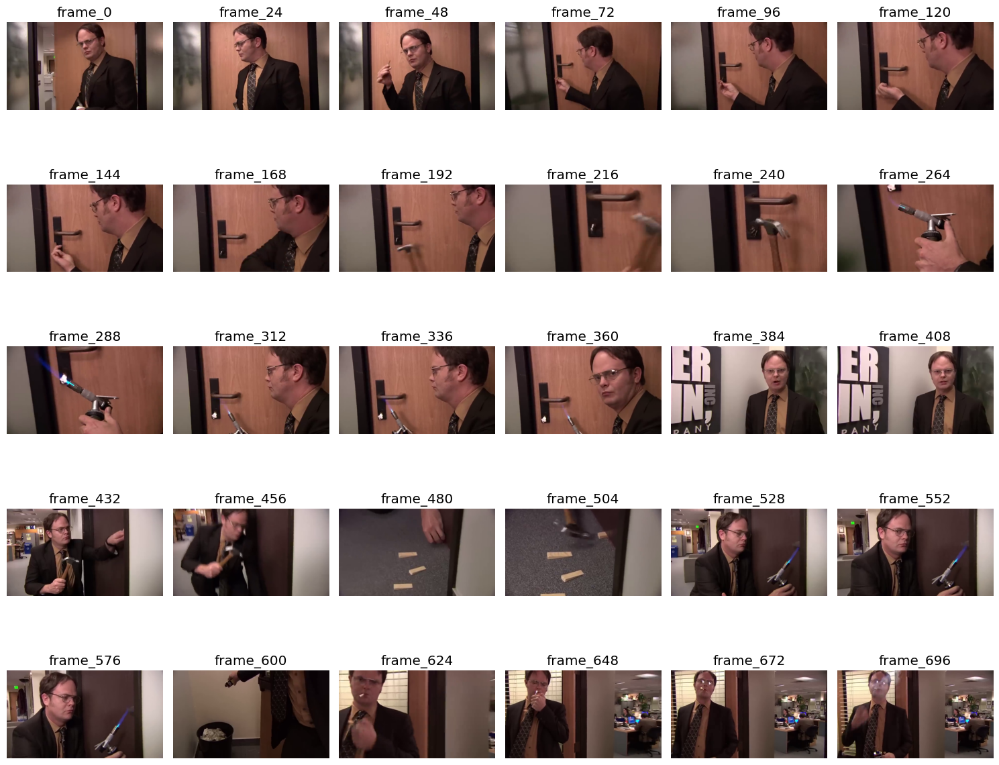

In [19]:
plot_frames(frame_label_list, frame_freq)

### Function based on previous code

In [22]:
# Function version of the previous code

def frames_to_label_part(video_path: str, label_frequency=1, start_point=20, end_point=50):

    # Load the full mp4 video, open in cap object
    cap = cv2.VideoCapture(video_path)
    frame_rate_fps = int(round(cap.get(cv2.CAP_PROP_FPS),0))
    n_frames = int(round(cap.get(cv2.CAP_PROP_FRAME_COUNT),0))

    # Calculate the start and stop frame
    start_frame = start_point*frame_rate_fps
    end_frame = end_point*frame_rate_fps
    n_frames = end_frame - start_frame

    # Calculate frame label frequency and total frames to label based on video properties
    frame_freq = frame_rate_fps*label_frequency
    total_frames_to_label = int(n_frames/frame_freq)

    # set the start frame to interate from there
    cap.set(cv2.CAP_PROP_POS_FRAMES, start_frame)

    # loops through the video object and gets the frame based on the frame frequency
    frame_label_list = []
    for frame in range(start_frame, end_frame):
        ret, img = cap.read()
        # When you reach the end of the movie ret becomes False, it breaks
        if ret == False:
            break
        # Frames to be recovered are the multiples of the frame_freq
        if frame % frame_freq == 0:
            image = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            frame_label_list.append(image)
    
    # Report the setting and outputs
    print(f"Movie frame rate: {frame_rate_fps}fps")
    print(f"Movie range: time={start_point_s}s, frame={start_frame} to time={end_point_s}s, frame={end_frame} ")
    print(f"Movie total frames: {n_frames}")
    print(f"Choosen detection frequency: every {frame_freq} frames")
    print(f"Total images the analyse: {total_frames_to_label}")
    
    # release cap object
    cap.release()
    
    # Return a list with the images of the selected frames, could also return a dictionary with chosen setting outcomes
    return frame_label_list, frame_freq

### Function saving cropped video also

In [80]:
def frames_to_label_part_video(video_path: str, label_frequency=1, start_point=20, end_point=50):
    # Load the full mp4 video, open in cap object
    cap = cv2.VideoCapture(video_path)
    frame_rate_fps = int(round(cap.get(cv2.CAP_PROP_FPS),0))
    n_frames = int(round(cap.get(cv2.CAP_PROP_FRAME_COUNT),0))

    # Calculate the start and stop frame
    start_frame = start_point*frame_rate_fps
    end_frame = end_point*frame_rate_fps
    n_frames = end_frame - start_frame

    # Calculate frame label frequency and total frames to label based on video properties
    frame_freq = frame_rate_fps*label_frequency
    total_frames_to_label = int(n_frames/frame_freq)

    # set the start frame to iterate from there
    cap.set(cv2.CAP_PROP_POS_FRAMES, start_frame)

    # Create an empty list to store frames to be labeled
    frame_label_list = []

    # Create a VideoWriter object to save the video
    fourcc = cv2.VideoWriter_fourcc(*"mp4v")
    video_out = cv2.VideoWriter("output_cropped.mp4", fourcc, frame_rate_fps, (int(cap.get(cv2.CAP_PROP_FRAME_WIDTH)), int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))))

    # Loop through the video object
    for frame in range(start_frame, end_frame):
        ret, img = cap.read()
        # When you reach the end of the movie ret becomes False, it breaks
        if not ret:
            break
        # Frames to be recovered are the multiples of the frame_freq
        if frame % frame_freq == 0:
            # Convert the image to RGB and add it to the list
            image = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            frame_label_list.append(image)
        # Write the current frame to the output video
        video_out.write(img)
        
     # Report the setting and outputs
    print(f"Movie frame rate: {frame_rate_fps}fps")
    print(f"Movie range: time={start_point}s, frame={start_frame} to time={end_point}s, frame={end_frame} ")
    print(f"Movie total frames: {n_frames}")
    print(f"Choosen detection frequency: every {frame_freq} frames")
    print(f"Total images the analyse: {total_frames_to_label}")

    # Release the video object and the VideoWriter object
    cap.release()
    video_out.release()
    
    # Return a list with the images of the selected frames, could also return a dictionary with chosen setting outcomes
    return frame_label_list, frame_freq

In [81]:
# Testing the video function
frame_label_list, frame_freq = frames_to_label_part_video(video_path, label_frequency=1, start_point=20, end_point=50)

Movie frame rate: 24fps
Movie range: time=20s, frame=480 to time=50s, frame=1200 
Movie total frames: 720
Choosen detection frequency: every 24 frames
Total images the analyse: 30


In [5]:
# Not working here but I can play it in the folder
ipd.Video('/home/daniel/code/dosorio79/code/kolapally/computer_vision/notebooks/video_analysis/output_cropped.mp4', width=500)

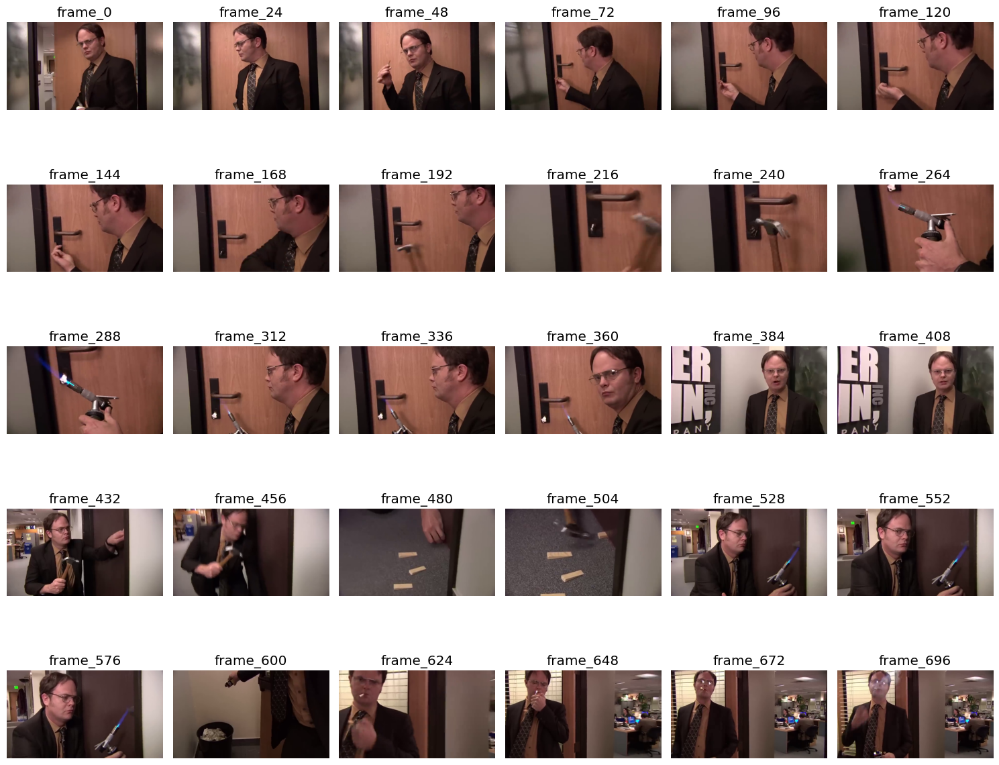

In [82]:
plot_frames(frame_label_list, frame_freq)

# Crop faces and predict for the selected frames list

## Notebook version

In [26]:
from compvis.preprocess.face_detect_single import face_detect_single
from compvis.model.model import *

# These are global variables/params to be loaded
model = model_load('/home/daniel/code/dosorio79/code/kolapally/computer_vision/compvis/interface/models/model.h5')
class_names = ['Angela','Dwight','Jim','Kevin','Michael','Pam','unknown']

# For each frame on the list of frames to label, run crop and prediction
img_proc_list = []
face_coord_dict = {}
face_label_dict = {}

for i, img in enumerate(frame_label_list):
    #Crop faces and get the crop path, image and square coordinates in a list
    cropped_img_path, faces_coords, image = face_detect_single(img, 'jpg')
    img_proc_list.append(image)
    face_coord_dict[f"frame_{i*frame_freq}"] = faces_coords
    
    # predict the faces and store the predicted labels in a list
    label, images = model_predict(model, cropped_img_path , class_names, target_size=(128,128))
    face_label_dict[f"frame_{i*frame_freq}"] = label
    
# returns the info necessary to do the labelling -  img_proc_list list of the processed images, 
# face_coord_dict for each frame all the faces dictionary, face_label_dict for each frame a list of predicted labels


✅ Model loaded from local disk
1/1 [==============================] - 0s 207ms/step
/home/daniel/code/dosorio79/code/kolapally/computer_vision/notebooks/video_analysis/cropped/image_face0.jpg is saved
1/1 [==============================] - 6s 6s/step
image_face0.jpg--0.7970127463340759--Kevin
✅ Prediction completed
1/1 [==============================] - 0s 196ms/step
/home/daniel/code/dosorio79/code/kolapally/computer_vision/notebooks/video_analysis/cropped/image_face0.jpg is saved
1/1 [==============================] - 0s 239ms/step
image_face0.jpg--0.776022732257843--Kevin
✅ Prediction completed
1/1 [==============================] - 0s 185ms/step
/home/daniel/code/dosorio79/code/kolapally/computer_vision/notebooks/video_analysis/cropped/image_face0.jpg is saved
1/1 [==============================] - 0s 247ms/step
image_face0.jpg--0.4688186049461365--Kevin
✅ Prediction completed
1/1 [==============================] - 0s 180ms/step
✅ Prediction completed
1/1 [=========================

In [27]:
face_coord_dict

{'frame_0': {0: (291, 47, 79, 101)},
 'frame_24': {0: (251, 48, 81, 106)},
 'frame_48': {0: (265, 71, 88, 107)},
 'frame_72': {},
 'frame_96': {},
 'frame_120': {},
 'frame_144': {},
 'frame_168': {},
 'frame_192': {},
 'frame_216': {},
 'frame_240': {},
 'frame_264': {},
 'frame_288': {},
 'frame_312': {},
 'frame_336': {},
 'frame_360': {0: (354, 47, 145, 187)},
 'frame_384': {0: (384, 56, 92, 117)},
 'frame_408': {0: (389, 58, 91, 112)},
 'frame_432': {0: (185, 47, 77, 98)},
 'frame_456': {0: (212, 27, 72, 100)},
 'frame_480': {},
 'frame_504': {},
 'frame_528': {0: (222, 56, 95, 125)},
 'frame_552': {0: (195, 42, 105, 136)},
 'frame_576': {0: (178, 58, 108, 141)},
 'frame_600': {},
 'frame_624': {0: (51, 0, 117, 132)},
 'frame_648': {0: (87, 8, 84, 110)},
 'frame_672': {0: (102, 14, 74, 88)},
 'frame_696': {0: (133, 14, 76, 88)}}

In [28]:
face_label_dict

{'frame_0': ['Kevin'],
 'frame_24': ['Kevin'],
 'frame_48': ['unknown'],
 'frame_72': [],
 'frame_96': [],
 'frame_120': [],
 'frame_144': [],
 'frame_168': [],
 'frame_192': [],
 'frame_216': [],
 'frame_240': [],
 'frame_264': [],
 'frame_288': [],
 'frame_312': [],
 'frame_336': [],
 'frame_360': ['Dwight'],
 'frame_384': ['unknown'],
 'frame_408': ['Dwight'],
 'frame_432': ['unknown'],
 'frame_456': ['Pam'],
 'frame_480': [],
 'frame_504': [],
 'frame_528': ['Dwight'],
 'frame_552': ['Dwight'],
 'frame_576': ['Dwight'],
 'frame_600': [],
 'frame_624': ['unknown'],
 'frame_648': ['Jim'],
 'frame_672': ['unknown'],
 'frame_696': ['Michael']}

## Function version to run face detect, model predict and API output on the frame list

In [83]:
from compvis.preprocess.face_detect_single import face_detect_single
from compvis.model.model import *
from compvis.api.face_labeling import api_output

# These are global variables/params to be loaded
model = model_load('/home/daniel/code/dosorio79/code/kolapally/computer_vision/compvis/interface/models/model.h5')
class_names = ['Angela','Dwight','Jim','Kevin','Michael','Pam','unknown']
target_size = (128,128)

def video_label_faces(frame_label_list):
    
    # For each frame on the list of frames to label, run crop and prediction
    img_labelled_list = []

    for i, img in enumerate(frame_label_list):
        
        # Crop faces and get the crop path, image and square coordinates 
        cropped_img_path, faces_coords, image = face_detect_single(img, 'jpg')
        
        # predict the faces and store the predicted labels in a list
        label, images = model_predict(model, cropped_img_path , class_names, target_size=target_size)
        
        # label the faces
        image_labeled = api_output(image,faces_coords,label)
        
        # Store labelled frames
        img_labelled_list.append(image_labeled)
        
    return img_labelled_list 

✅ Model loaded from local disk


In [84]:
img_labelled_list  = video_label_faces(frame_label_list)

1/1 [==============================] - 0s 208ms/step
/home/daniel/code/dosorio79/code/kolapally/computer_vision/notebooks/video_analysis/cropped/image_face0.jpg is saved
1/1 [==============================] - 5s 5s/step
image_face0.jpg--0.7970127463340759--Kevin
✅ Prediction completed
1/1 [==============================] - 0s 184ms/step
/home/daniel/code/dosorio79/code/kolapally/computer_vision/notebooks/video_analysis/cropped/image_face0.jpg is saved
1/1 [==============================] - 0s 221ms/step
image_face0.jpg--0.776022732257843--Kevin
✅ Prediction completed
1/1 [==============================] - 0s 168ms/step
/home/daniel/code/dosorio79/code/kolapally/computer_vision/notebooks/video_analysis/cropped/image_face0.jpg is saved
1/1 [==============================] - 0s 235ms/step
image_face0.jpg--0.4688186049461365--Kevin
✅ Prediction completed
1/1 [==============================] - 0s 132ms/step
✅ Prediction completed
1/1 [==============================] - 0s 138ms/step
✅ Predic

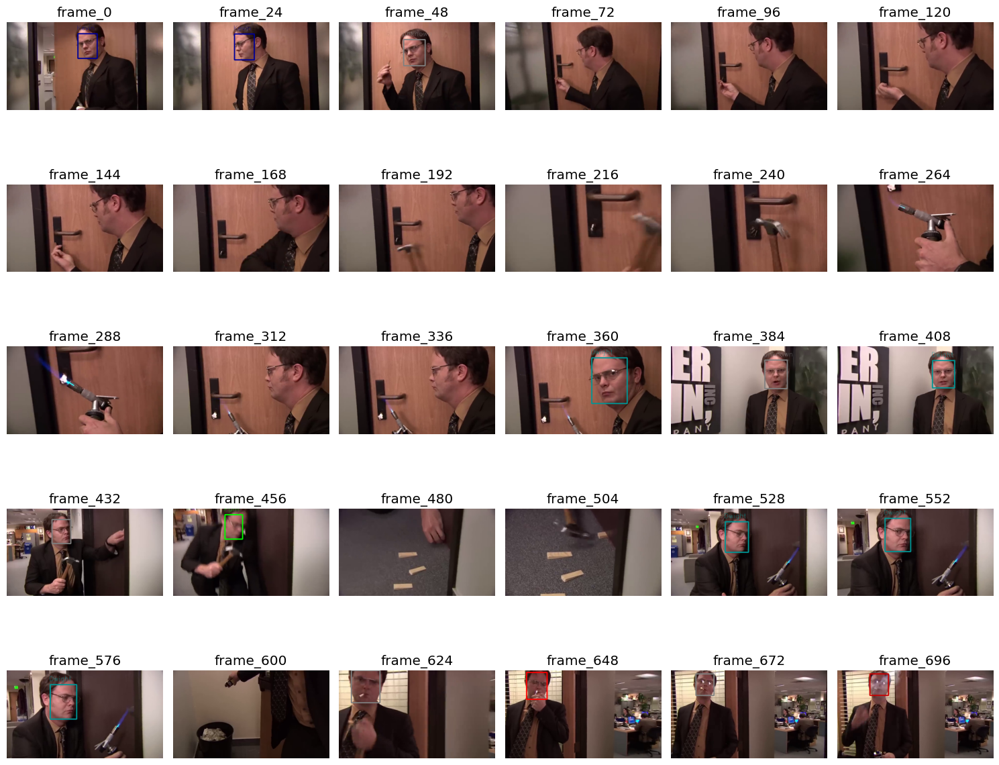

In [17]:
plot_frames(img_labelled_list, frame_freq)

# Saving video inserting the labeled frames 

In [18]:
len(img_labelled_list)

30

In [109]:
# Check if this approach using tuples works, to make things simpler you could just recreate the image list here using the frame_freq and the image_labelled list (i*frame_freq, image)

def video_labelled(video_path: str, img_labelled_list: list, frame_freq, label_duration=0.3):
    
    # Load the original video
    cap = cv2.VideoCapture(video_path)
    frame_rate_fps = int(round(cap.get(cv2.CAP_PROP_FPS),0))
    n_frames = int(round(cap.get(cv2.CAP_PROP_FRAME_COUNT),0))
    
    # Convert image_labelled_list to an frame indexed labelled list
    img_labelled_list = [(i*frame_freq, image) for i, image in enumerate(img_labelled_list)]

    # Create a VideoWriter object to save the output video
    fourcc = cv2.VideoWriter_fourcc(*"mp4v")
    video_out = cv2.VideoWriter("labeled_video.mp4", fourcc, frame_rate_fps, (int(cap.get(cv2.CAP_PROP_FRAME_WIDTH)), int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))))

    # Set the start frame to iterate from there
    cap.set(cv2.CAP_PROP_POS_FRAMES, 0)

    # Initialize label frame index
    label_index = 0

    # Calculate the duration of the labelled frames in frames
    label_duration_frames = int(label_duration * frame_rate_fps)

    # Loop through the video and inserted the labelled frames at the original postions
    for i in range(n_frames):
        ret, img = cap.read()
        
        # Turns false at the end of the object
        if ret == False:
            break

        # If the current frame is a label frame, add and replicate for the chosen duration
        if label_index < len(img_labelled_list) and i == img_labelled_list[label_index][0]:
            label_frame = img_labelled_list[label_index][1]
            # Replicate the labelled frame to make it more obvious
            for j in range(label_duration_frames):
                video_out.write(cv2.cvtColor(label_frame, cv2.COLOR_BGR2RGB)) #Somehow the inserted frames were in BGR and others in RGB
            label_index += 1
        # Otherwise just add the original frame
        else:
            video_out.write(img)

    # Release the video objects and the VideoWriter object
    cap.release()
    video_out.release()

In [110]:
video_path = '/home/daniel/code/dosorio79/code/kolapally/computer_vision/notebooks/video_analysis/output_cropped.mp4'
video_labelled(video_path, img_labelled_list, frame_freq, label_duration=0.5)

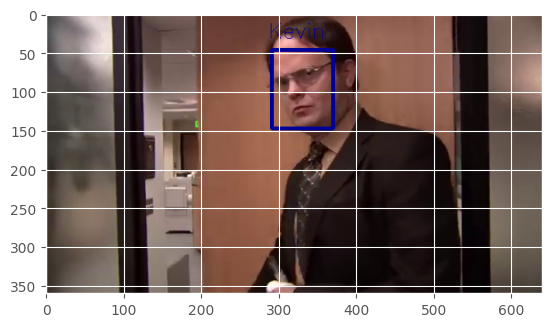

In [93]:
plt.imshow(img_labelled_list[0])